#FINAL PROJECT - DEEP LEARNING LAB 

####Cesare Barbera 
####Francesca Padovani

#####ASSIGNMENT OUTLINE
In this assignment you are expected to build, train and evaluate a deep learning framework on a standard
setting of **Unsupervised Domain Adaptation (UDA)**. As you have studied during the theoretical course,
UDA is a generic expression that covers any possible technique designed to address the **issue of the domain
shift** that may exist between two or more data distributions. In particular, for this assignment you will be
provided with a UDA benchmark consisting of two datasets. You will be required to treat one of the two
datasets as source domain and the other as target domain, and to propose a UDA technique to counteract the
negative impact of the domain gap when training your model on the source distribution and evaluating it on
the target distribution. As it holds for any standard UDA framework, `the quality of the domain alignment
strategy shall essentially be assessed by looking at the` **gain** `obtained with your proposed framework` over the
so called source-only baseline.

Installing **wandb** - plotting tool to monitor the training trend and generate graphs.

In [ ]:
!pip install wandb -qqq

     |████████████████████████████████| 1.8 MB 5.4 MB/s 
     |████████████████████████████████| 145 kB 49.6 MB/s 
     |████████████████████████████████| 181 kB 47.7 MB/s 
     |████████████████████████████████| 63 kB 1.7 MB/s 


Importing some of the required **libraries** to access the file system of Colab

In [ ]:
import os
from tqdm import tqdm
from google.colab import drive
import shutil
import wandb
import cv2
import matplotlib.pyplot as plt

Mounting my Google Drive 

In [ ]:
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


Trying to open and show two images of the dataset:
the first one corresponding to the set of product images domain, and the second one corresponding to the real world domain. 
We chose to show pictures of **backpaks** from both domains. 



(679, 679, 3)

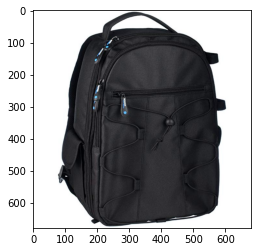

In [ ]:
img_source = cv2.imread('/content/gdrive/MyDrive/DEEP_LEARNING_LAB/adaptiope_small_2/product_images/backpack/backpack_003.jpg')

plt.imshow(img_source)
img_source.shape

(1714, 1059, 3)

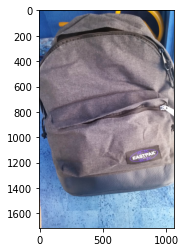

In [ ]:
img_target = cv2.imread('/content/gdrive/MyDrive/DEEP_LEARNING_LAB/adaptiope_small_2/real_life/backpack/backpack_040.jpg')

plt.imshow(img_target)
img_target.shape

Importing the libraries needed to perform the deep learning part, that is the **training** of the model and the **domain alignment** task. 

In [ ]:
import torch
import random
import pandas as pd
from torchvision.utils import make_grid
import torchvision
from torch.autograd import grad
from torchvision import models
from torchvision import datasets, transforms
from torch.utils.data import Dataset, DataLoader, Subset, random_split
from torchvision.datasets import ImageFolder
from sklearn.model_selection import train_test_split
from torchvision.transforms import Compose, ToTensor, Resize, ToTensor, Lambda
import torch.nn.functional as F
import torch.optim as optim
from torch.autograd import Variable
from torch.nn import Linear, ReLU, CrossEntropyLoss, Sequential, Conv2d, MaxPool2d, Module, Softmax, BatchNorm2d, Dropout
import torch.nn as nn
from torch.optim import Adam, SGD
from torch.utils.tensorboard import SummaryWriter

### FIRST DIRECTION

Here below we define the root of the two datasets of interest. In the **first direction** we use the images of the *product_images* dataset as *source domain* and the images of the *real_life* dataset as *target domain*. 

In [ ]:
root_source = '/content/gdrive/MyDrive/DEEP_LEARNING_LAB/adaptiope_small_2/product_images'
root_target = '/content/gdrive/MyDrive/DEEP_LEARNING_LAB/adaptiope_small_2/real_life'

We define the **Data Loader function**, which enables us to load the data in the correct form as required by the DL Model we are going to use. 

While composing our **list of transformation** to be applied on the images of the source and target domain at loading time, we opted to choose normalization values for both of datasets. Since the Resnet model we are using has been **pre-trained on ImageNet**, it is appropriate to perform the learning and the testing by using similar normalization values. 

For the training phase and the testing phase we kept exactly the same value used with ImageNet for the mean and the std of the three image channels, the specific numbers can be seen in the code below. 
During our implementation we also tried to use a different set of numbers for normalization approximating by excess to mean 0.5 and std 0.3, only for the images of the target domain, but this returned us worse performances in the source only model. We therefore decided to keep the previous values, a decision we also made after seeing the [thread](https://discuss.pytorch.org/t/discussion-why-normalise-according-to-imagenet-mean-and-std-dev-for-transfer-learning/115670) opened on Pytorch about this topic. 


The idea of **data normalization** is a general concept that refers to the act of transforming the original values of a dataset to new values. The new values are typically encoded relative to the dataset itself and are scaled in some way, in this case we are normalizing our input images, so that our neural network can recognize them better. 

We also applied a **RESIZE** to **256 x 256** and a **CROP** to **224 x 224**, as it has been suggested in the assignment description. In addition, we applied a **RANDOMHORIZONTALFLIP** to both datasets which basically horizontally flipped the given image randomly with a given probability.

In [ ]:
def get_data(root_source, root_target, batch_size, test_batch_size=32):
  
  source_transform = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ])
  
  target_transform = transforms.Compose([
        transforms.Resize(256),
        transforms.Resize((224,224)),
        transforms.ToTensor(),
        transforms.RandomHorizontalFlip(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ])
  
  #load source = product images
  full_data_source = datasets.ImageFolder(root=root_source,
                                           transform=source_transform)

  # load target = real_life images
  full_data_target = datasets.ImageFolder(root=root_target,
                                           transform=target_transform) 
  
  #define the quantity of elements you want for training and for test (80% and 20%) in the source dataset
  num_samples_s = len(full_data_source)
  training_samples_s = int(num_samples_s * 0.8)
  test_samples_s = num_samples_s - training_samples_s
  
  #split source between training (80% of the images) and test sets (20% of the images)
  training_data_source, test_data_source = torch.utils.data.random_split(full_data_source, [training_samples_s, test_samples_s])
  

  #define the quantity of elements you want for training and for test (80% and 20%) in the source dataset
  num_samples_t = len(full_data_target)
  training_samples_t = int(num_samples_t * 0.8)
  test_samples_t = num_samples_t - training_samples_t

  #split target between training (80% of the images) and test sets (20% of the images)
  training_data_target, test_data_target = torch.utils.data.random_split(full_data_target, [training_samples_t, test_samples_t])
  

  # initialize dataloaders
  source_train_loader = torch.utils.data.DataLoader(training_data_source, batch_size, shuffle=True, drop_last=False)
  source_test_loader = torch.utils.data.DataLoader(test_data_source, test_batch_size, shuffle=False)

  target_train_loader = torch.utils.data.DataLoader(training_data_target, batch_size, shuffle=True, drop_last=False)
  target_test_loader = torch.utils.data.DataLoader(test_data_target, test_batch_size, shuffle=False)
  
  return source_train_loader, source_test_loader, target_train_loader, target_test_loader

In the following cell we instantiate a class for our main model, which will be used to perform the basic classification task, passing through the training and the test phase. 

We decided to use a Residual Network $(RESNET -50)$ **pre-trained on ImageNet**, finetuning the last classification layer and adapting it to our purposes. 
Our fully-connected layer performs a sequence of two operations: dropout and linear transformation of the input features in order to classify them into the 20 classes of out dataset. 


* **DROPOUT**: during training, randomly zeroes some of the elements of the input tensor with probability p using samples from a Bernoulli distribution

* **LINEAR TRANSFORMATION**: applies a linear transformation to the incoming data  $ y = xA^T + b $

In [ ]:
class ResNet(nn.Module):

    def __init__(self, num_classes=20, pretrained=True):
        super(ResNet, self).__init__()
        self.model = models.resnet50(pretrained=pretrained) 
        num_ftrs = self.model.fc.in_features
        self.model.fc = nn.Sequential(nn.Dropout(0.5), 
                                      nn.Linear(num_ftrs, num_classes))  
        

    def forward(self, x):
        return self.model(x)

With the following function we define the **custom optimization criterion** for the different layers of our Model. 
In particular, the pre-trained layers need to be updated at a lesser rate than the newly initialized layer. 

In order to achieve this objective, we will create **two groups of parameters/weights** as we did in one of the labs of the course; one for the newly initialized layer and the other for the other layers of the network. We will then assign two distinct learning rates accordingly.
Thus, the learning rate assigned to the last classification layer is lower (slower learning) than that assigned to the previous layers already pre-trained on the ImageNet dataset.

In [ ]:
def get_optimizer(model, lr, wd, momentum):
  
  #we will create two groups of weights
  #and the other for the rest of the layers of the network
  
  final_layer_weights = []
  rest_of_the_net_weights = []
  
  #iterate through the layers of the network and save them in the correct list
  for name, param in model.named_parameters():
    if name.startswith('fc'):
      final_layer_weights.append(param)
    else:
      rest_of_the_net_weights.append(param)
  
  #assign the correct learning rates to each group of parameters
  optimizer = torch.optim.SGD([
      {'params': rest_of_the_net_weights},
      {'params': final_layer_weights, 'lr': lr}
  ], lr=lr / 10, weight_decay=wd, momentum=momentum)
  
  return optimizer

With the following function we just obtain the **Cost/Loss Function** to be applied to calculate the error between the predictions of our model and the ground truth. 

We choose **Cross Entropy Loss** (or log loss)  which is commonly used for multi-label classification. Cross-entropy loss measures the performance of a classification model whose output is a probability value between 0 and 1. It increases as the predicted probability diverges from the actual label. 
EXAMPLE: So predicting a probability of .012 when the actual observation label is 1 would be bad and result in a high loss value. A perfect model would have a log loss of 0.

[Pytorch Documentation for Cross Entropy Loss](https://pytorch.org/docs/stable/generated/torch.nn.CrossEntropyLoss.html#:~:text=This%20criterion%20computes%20the%20cross,to%20each%20of%20the%20classes.)

In [ ]:
def get_cost_function():
  cost_function = torch.nn.CrossEntropyLoss()
  return cost_function

We define the training and the test step for our Classification Task. 

In [ ]:
def training_step(net, data_loader, optimizer, cost_function,device = 'cuda'):

  samples = 0.
  cumulative_loss = 0.
  cumulative_accuracy = 0.

  # set the network to training mode: particularly important when using dropout!
  net.train() 

  # iterate over the training set
  for batch_idx, (inputs, targets) in enumerate(data_loader):

    # load data into GPU
    inputs = inputs.to(device)
    targets = targets.to(device)
      
    # forward pass
    outputs = net(inputs)

    # loss computation
    loss = cost_function(outputs,targets)

    # backward pass
    loss.backward()
    
    # parameters update
    optimizer.step()
    
    # gradients reset
    optimizer.zero_grad()

    # fetch prediction and loss value
    samples += inputs.shape[0]
    cumulative_loss += loss.item()
    _, predicted = outputs.max(dim=1) # max() returns (maximum_value, index_of_maximum_value)

    # compute training accuracy
    cumulative_accuracy += predicted.eq(targets).sum().item()

  return cumulative_loss/samples, cumulative_accuracy/samples*100

def test_step(net, data_loader, cost_function, device = 'cuda'):
  samples = 0.
  cumulative_loss = 0.
  cumulative_accuracy = 0.

  # set the network to evaluation mode
  net.eval() 

  # disable gradient computation (we are only testing, we do not want our model to be modified in this step!)
  with torch.no_grad():

    # iterate over the test set
    for batch_idx, (inputs, targets) in enumerate(data_loader):
  
      # load data into GPU
      inputs = inputs.to(device)
      targets = targets.to(device)
        
      # forward pass
      outputs = net(inputs)

      # loss computation
      loss = cost_function(outputs, targets)

      # fetch prediction and loss value
      samples+=inputs.shape[0]
      cumulative_loss += loss.item() # Note: the .item() is needed to extract scalars from tensors
      _, predicted = outputs.max(1)

      # compute accuracy
      cumulative_accuracy += predicted.eq(targets).sum().item()

  return cumulative_loss/samples, cumulative_accuracy/samples*100

## SOURCE ONLY first direction PRODUCT -> REAL WORLD

In the following cell we instantiate the main function for the source only model. At this stage we are training our model on the product domain and testing it on the real domain.
After running **20 epochs**, the accuracy that we obtain is not extremely high (**77%**) because the real world images are much more complex and various in terms of contexts, brigthness, positions and other factors.

In [ ]:
def main_so_first(source_root = None,
         target_root = None,
         batch_size=32, 
         device='cuda:0', 
         learning_rate=0.001, 
         weight_decay=0.000001, 
         momentum=0.9, 
         epochs=20, 
         num_classes=20
        ):
  

  #initialize wandb logging tools
  wandb.init(
      project="DL_project", 
      name="first_direction_so", 
      config={
      "learning_rate": 0.001,
      "architecture": "RESNET",
      "dataset": "Adaptiope",
      "epochs": 20,
      })
  
  writer = SummaryWriter(log_dir="runs/first_dir_so")

  # instantiates dataloaders
  train_loader_source, test_loader_source, train_loader_target, test_loader_target = get_data(source_root, target_root, batch_size=batch_size)
  
  # instantiates the model
  net = ResNet(num_classes = num_classes).to(device)
  
  # instantiates the optimizer
  optimizer = get_optimizer(net, learning_rate, weight_decay, momentum)
  
  # instantiates the cost function
  cost_function = get_cost_function()

  # perform a preliminar step
  print('Before training:')
  train_loss, train_accuracy = test_step(net, train_loader_source, cost_function)
  test_loss, test_accuracy = test_step(net, test_loader_target, cost_function)

  print('\t Training loss {:.5f}, Training accuracy {:.2f}'.format(train_loss, train_accuracy))
  print('\t Test loss {:.5f}, Test accuracy {:.2f}'.format(test_loss, test_accuracy))
  print('-----------------------------------------------------')
  
  wandb.log({"train_acc": train_accuracy, "train_loss": train_loss})
  wandb.log({"test_acc": test_accuracy, "test_loss": test_loss})

  # add values to logger
  writer.add_scalar('Loss/train_loss', train_loss, 0)
  writer.add_scalar('Loss/test_loss', test_loss, 0)
  writer.add_scalar('Accuracy/train_accuracy', train_accuracy, 0)
  writer.add_scalar('Accuracy/test_accuracy', test_accuracy, 0)

  # range over the number of epochs
  for e in range(epochs):
    train_loss, train_accuracy = training_step(net, train_loader_source, optimizer, cost_function)
    test_loss, test_accuracy = test_step(net, test_loader_target, cost_function)
    print('Epoch: {:d}'.format(e+1))
    print('\t Training loss {:.5f}, Training accuracy {:.2f}'.format(train_loss, train_accuracy))
    print('\t Test loss {:.5f}, Test accuracy {:.2f}'.format(test_loss, test_accuracy))
    print('-----------------------------------------------------')
    
    # add values to logger
    writer.add_scalar('Loss/train_loss', train_loss, e + 1)
    writer.add_scalar('Loss/test_loss', test_loss, e + 1)
    writer.add_scalar('Accuracy/train_accuracy', train_accuracy, e + 1)
    writer.add_scalar('Accuracy/test_accuracy', test_accuracy, e + 1)

    #add values to the second logger
    wandb.log({"train_acc":train_accuracy , "train_loss": train_loss})
    wandb.log({"test_acc":test_accuracy , "test_loss": test_loss})

  # perform final test step and print the final metrics
  print('After training:')
  train_loss, train_accuracy = test_step(net, train_loader_source, cost_function)
  test_loss, test_accuracy = test_step(net, test_loader_target, cost_function)

  print('\t Training loss {:.5f}, Training accuracy {:.2f}'.format(train_loss, train_accuracy))
  print('\t Test loss {:.5f}, Test accuracy {:.2f}'.format(test_loss, test_accuracy))
  print('-----------------------------------------------------')

  # close the loggers
  writer.close()
  wandb.finish()

In [ ]:
main_so_first(source_root=root_source, target_root = root_target)

Before training:
	 Training loss 0.09627, Training accuracy 5.69
	 Test loss 0.09940, Test accuracy 6.50
-----------------------------------------------------
Epoch: 1
	 Training loss 0.09352, Training accuracy 8.62
	 Test loss 0.09367, Test accuracy 14.75
-----------------------------------------------------
Epoch: 2
	 Training loss 0.08371, Training accuracy 24.12
	 Test loss 0.08827, Test accuracy 35.50
-----------------------------------------------------
Epoch: 3
	 Training loss 0.07470, Training accuracy 43.50
	 Test loss 0.08275, Test accuracy 48.75
-----------------------------------------------------
Epoch: 4
	 Training loss 0.06576, Training accuracy 62.75
	 Test loss 0.07656, Test accuracy 61.00
-----------------------------------------------------
Epoch: 5
	 Training loss 0.05668, Training accuracy 74.88
	 Test loss 0.07155, Test accuracy 65.50
-----------------------------------------------------
Epoch: 6
	 Training loss 0.04802, Training accuracy 81.06
	 Test loss 0.06663

test_acc,▁▂▄▅▇▇▇▇▇████████████
test_loss,▁██▇▇▆▆▆▅▅▅▅▄▄▄▄▄▄▄▄▄
train_acc,▁▂▃▄▆▆▇▇▇████████████
train_loss,▁█▇▇▆▅▅▄▄▃▃▃▃▂▂▂▂▂▂▂▂
test_acc,77.5
test_loss,0.03525
train_acc,97.25
train_loss,0.00952


## UPPER BOUND first direction PRODUCT -> REAL WORLD
In the following cell we instantiate the main function for the upper bound model. At this stage we have trained our model on the training set of both domains and tested it on the test set of the target domain.
The accuracy that we obtain is showing us the best prediction accuracy reachable by our model, the one that we should manage to approximate with the domain adaptation phase, but never be able to reach.
We obtain a **fairly high accuracy$ = 96,5%$**.  

In [ ]:
def main_ub_first(source_root = None,
         target_root = None,
         batch_size=32, 
         device='cuda:0', 
         learning_rate=0.001, 
         weight_decay=0.000001, 
         momentum=0.9, 
         epochs=20, 
         num_classes=20
        ):
  
  wandb.init(
      project="DL_project", 
      name="first_direction_ub", 
      config={
      "learning_rate": 0.001,
      "architecture": "RESNET",
      "dataset": "Adaptiope",
      "epochs": 20,
      })
  
  writer = SummaryWriter(log_dir="runs/first_dir_ub")

  # instantiates dataloaders
  train_loader_source, test_loader_source, train_loader_target, test_loader_target = get_data(source_root, target_root, batch_size=batch_size)
  
  # instantiates the model
  net = ResNet(num_classes = num_classes).to(device)
  
  # instantiates the optimizer
  optimizer = get_optimizer(net, learning_rate, weight_decay, momentum)
  
  # instantiates the cost function
  cost_function = get_cost_function()

  # perform a preliminar step
  print('Before training:')
  train_loss, train_accuracy = test_step(net, train_loader_source, cost_function)
  test_loss, test_accuracy = test_step(net, test_loader_target, cost_function)

  print('\t Training loss {:.5f}, Training accuracy {:.2f}'.format(train_loss, train_accuracy))
  print('\t Test loss {:.5f}, Test accuracy {:.2f}'.format(test_loss, test_accuracy))
  print('-----------------------------------------------------')
  
  # add values to logger
  writer.add_scalar('Loss/train_loss', train_loss, 0)
  writer.add_scalar('Loss/test_loss', test_loss, 0)
  writer.add_scalar('Accuracy/train_accuracy', train_accuracy, 0)
  writer.add_scalar('Accuracy/test_accuracy', test_accuracy, 0)

  #log to wandb 
  wandb.log({"train_acc": train_accuracy, "train_loss": train_loss})
  wandb.log({"test_acc": test_accuracy, "test_loss": test_loss})

  # range over the number of epochs
  for e in range(epochs):

    train_loss, train_accuracy = training_step(net, train_loader_source, optimizer, cost_function)
    train_loss_un, train_accuracy_un = training_step(net, train_loader_target, optimizer, cost_function)
    test_loss, test_accuracy = test_step(net, test_loader_target, cost_function)

    print('Epoch: {:d}'.format(e+1))
    print('\t Training loss {:.5f}, Training accuracy {:.2f}'.format(train_loss, train_accuracy))
    print('\t Test loss {:.5f}, Test accuracy {:.2f}'.format(test_loss, test_accuracy))
    print('-----------------------------------------------------')
    
    # add values to logger
    writer.add_scalar('Loss/train_loss', train_loss, e + 1)
    writer.add_scalar('Loss/test_loss', test_loss, e + 1)
    writer.add_scalar('Accuracy/train_accuracy', train_accuracy, e + 1)
    writer.add_scalar('Accuracy/test_accuracy', test_accuracy, e + 1)

    #log to wandb
    wandb.log({"train_acc": train_accuracy, "train_loss": train_loss})
    wandb.log({"test_acc": test_accuracy, "test_loss": test_loss})

  # perform final test step and print the final metrics
  print('After training:')
  train_loss, train_accuracy = test_step(net, train_loader_source, cost_function)
  test_loss, test_accuracy = test_step(net, test_loader_source, cost_function)

  print('\t Training loss {:.5f}, Training accuracy {:.2f}'.format(train_loss, train_accuracy))
  print('\t Test loss {:.5f}, Test accuracy {:.2f}'.format(test_loss, test_accuracy))
  print('-----------------------------------------------------')

  # close the logger
  writer.close()
  wandb.finish()

In [ ]:
#perform the actual training of the model
main_ub_first(source_root=root_source, target_root = root_target)

Before training:
	 Training loss 0.09681, Training accuracy 2.38
	 Test loss 0.09977, Test accuracy 3.00
-----------------------------------------------------
Epoch: 1
	 Training loss 0.09434, Training accuracy 6.56
	 Test loss 0.08698, Test accuracy 36.00
-----------------------------------------------------
Epoch: 2
	 Training loss 0.07825, Training accuracy 36.75
	 Test loss 0.07363, Test accuracy 71.00
-----------------------------------------------------
Epoch: 3
	 Training loss 0.06326, Training accuracy 66.62
	 Test loss 0.05991, Test accuracy 81.25
-----------------------------------------------------
Epoch: 4
	 Training loss 0.04888, Training accuracy 81.50
	 Test loss 0.04761, Test accuracy 86.00
-----------------------------------------------------
Epoch: 5
	 Training loss 0.03748, Training accuracy 87.19
	 Test loss 0.03846, Test accuracy 87.25
-----------------------------------------------------
Epoch: 6
	 Training loss 0.02794, Training accuracy 90.75
	 Test loss 0.03087

test_acc,▁▄▆▇▇████████████████
test_loss,█▇▆▅▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁
train_acc,▁▁▄▆▇▇▇██████████████
train_loss,██▇▅▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
test_acc,92.25
test_loss,0.01015
train_acc,97.5625
train_loss,0.00465


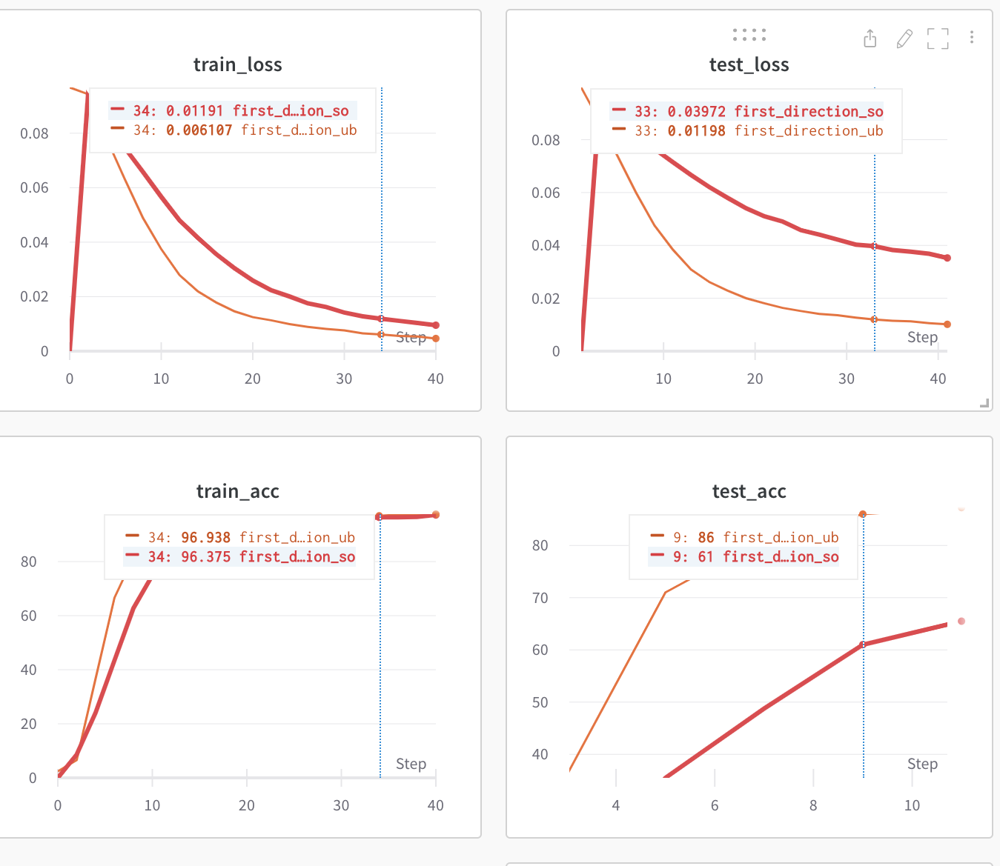

In [ ]:
from IPython.display import Image
Image(filename="/content/gdrive/MyDrive/DEEP_LEARNING_LAB/first.png")

Now that we have concluded the first step, we have the lower bound (source only) accuracy and the upper bound accuracy. 

Now we want to apply the **domain alignment phase** in order to reduce the shift and the difference in the distribution between the source and the target domain. In order to do that we apply a transfer loss (which in our case could be either MAXIMUM MEAN DISCREPANCY or CORAL and let the model backpropagate it after having summed it to the classification error obtained on the source domain. By optimizing the weights we attempt to align the two domains. Our main reference paper is [Deep CORAL](https://arxiv.org/abs/1607.01719).

###MMD
The first loss we used is MMD (Maximum Mean Discrepancy). Maximum mean discrepancy is a kernel based statistical test used to determine whether given two distribution they are the same. MMD can be used as a loss/cost function in various machine learning algorithms such as density estimation, generative models and also in invertible neural networks utilized in inverse problems. As opposed to generative adversarial networks (GANs) which require a solution to a complex min-max optimization problem, [**MMD criteria can be used as simpler discriminator**](https://www.onurtunali.com/ml/2019/03/08/maximum-mean-discrepancy-in-machine-learning.html).

In our code you can choose two different kernels for the MMD implementation:
* **linear kernel** → distance (difference) between feature means 

* [**radial basis kernel**](https://towardsdatascience.com/radial-basis-function-rbf-kernel-the-go-to-kernel-acf0d22c798a) → are the most generalized form of kernelization and is one of the most widely used kernels due to its connection with the Gaussian distribution. The RBF kernel function for two points X₁ and X₂ computes the similarity or how close they are to each other. This kernel can be mathematically represented as follows: $K(X_{1}, X_{2})=exp(-\frac{||X_{1}, X_{2}||^2}{2σ^2})$  

where,
  1. ‘σ’ is the variance and our hyperparameter
  2. ||X₁ - X₂|| is the Euclidean (L₂-norm) Distance between two points X₁ and X₂

###CORAL
The second loss we took into account is Coral Loss, implemented in the following paper [Deep CORAL](https://arxiv.org/abs/1607.01719).

This is a differentiable loss function that minimizes the difference between source and target second-order statistics such as **correlations**.

Suppose the number of source and target data are $n_{S}$ and $n_{T}$ respectively. Suppose $D_{S}^{ij} (D_{T}^{ij})$ indicates the j-th dimension of the i-th source (target) data example and $C_{S} (C_{T} )$ denote the feature covariance
matrices.
We derived the CORAL loss as the distance between the second-order statistics
(covariances) of the source and target features:

$l_{CORAL} = \frac{1}{4d^2}||C_{S}-C_{T}||_{F}^2$

where $||∘||_{F}^2$  denotes the squared matrix Frobenius norm.

It's important to notice that Minimizing the classification loss itself is
likely to lead to overfitting to the source domain, causing reduced performance on the target domain. On the other hand, minimizing the CORAL loss alone might lead to degenerated features. For example, the network could project all of the source and target data to a single point, making the CORAL loss trivially zero. However, no strong classifier can be constructed on these features.
Joint training with both the classification loss and CORAL loss is likely to learn features that work well on the target domain:

$l = l_{CLASSIFICATION} + Σ_{i = 0}^t λ{i}$ $l_{CORAL}$

where t denotes the number of CORAL loss layers in a deep network and λ is a weight that trades off the adaptation with classification accuracy on the
source domain.


In [ ]:
class MMD_loss(nn.Module):
    def __init__(self, kernel_type='rbf', kernel_mul=2.0, kernel_num=5):
        super(MMD_loss, self).__init__()
        self.kernel_num = kernel_num
        self.kernel_mul = kernel_mul
        self.fix_sigma = None
        self.kernel_type = kernel_type

    def guassian_kernel(self, source, target, kernel_mul=2.0, kernel_num=5, fix_sigma=None):
        n_samples = int(source.size()[0]) + int(target.size()[0])
        total = torch.cat([source, target], dim=0)
        total0 = total.unsqueeze(0).expand(
            int(total.size(0)), int(total.size(0)), int(total.size(1)))
        total1 = total.unsqueeze(1).expand(
            int(total.size(0)), int(total.size(0)), int(total.size(1)))
        L2_distance = ((total0-total1)**2).sum(2)
        if fix_sigma:
            bandwidth = fix_sigma
        else:
            bandwidth = torch.sum(L2_distance.data) / (n_samples**2-n_samples)
        bandwidth /= kernel_mul ** (kernel_num // 2)
        bandwidth_list = [bandwidth * (kernel_mul**i)
                          for i in range(kernel_num)]
        kernel_val = [torch.exp(-L2_distance / bandwidth_temp)
                      for bandwidth_temp in bandwidth_list]
        return sum(kernel_val)

    def linear_mmd2(self, f_of_X, f_of_Y):
        loss = 0.0
        delta = f_of_X.float().mean(0) - f_of_Y.float().mean(0)
        loss = delta.dot(delta.T)
        return loss

    def forward(self, source, target):
        if self.kernel_type == 'linear':
            return self.linear_mmd2(source, target)
        elif self.kernel_type == 'rbf':
            batch_size = int(source.size()[0])
            kernels = self.guassian_kernel(
                source, target, kernel_mul=self.kernel_mul, kernel_num=self.kernel_num, fix_sigma=self.fix_sigma)
            XX = torch.mean(kernels[:batch_size, :batch_size])
            YY = torch.mean(kernels[batch_size:, batch_size:])
            XY = torch.mean(kernels[:batch_size, batch_size:])
            YX = torch.mean(kernels[batch_size:, :batch_size])
            loss = torch.mean(XX + YY - XY - YX)
            return loss


In [ ]:
def CORAL(source, target):
  d = source.size(1)
  ns, nt = source.size(0), target.size(0)

  # source covariance
  tmp_s = torch.ones((1, ns)).cuda() @ source
  cs = (source.t() @ source - (tmp_s.t() @ tmp_s) / ns) / (ns - 1)

  # target covariance
  tmp_t = torch.ones((1, nt)).cuda() @ target
  ct = (target.t() @ target - (tmp_t.t() @ tmp_t) / nt) / (nt - 1)

  # frobenius norm
  loss = (cs - ct).pow(2).sum().sqrt()
  loss = loss / (4 * d * d)

  return loss

In the following part we define another class for the Resnet 50 model with some slight modifications - we basically re-assign the layers to new variables and we drop the classification layer. 

We add a function called *output_features* which serves the purpose of outputting the input features of the last layer of the network. 

In [ ]:
from torchvision import models
class ResNet50Fc(nn.Module): 
    def __init__(self):
        super(ResNet50Fc, self).__init__()
        model_resnet50 = models.resnet50(pretrained=True)
        self.conv1 = model_resnet50.conv1
        self.bn1 = model_resnet50.bn1
        self.relu = model_resnet50.relu
        self.maxpool = model_resnet50.maxpool
        self.layer1 = model_resnet50.layer1
        self.layer2 = model_resnet50.layer2
        self.layer3 = model_resnet50.layer3
        self.layer4 = model_resnet50.layer4
        self.avgpool = model_resnet50.avgpool
        self.__in_features = model_resnet50.fc.in_features

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        return x

    def output_features(self):
        return self.__in_features

With the following class, instead, we construct the Model class which will allow us to perform the transfer learning operation between the two domains. 
We load the base network and we add to it a bottleneck layer and a classification layer. 

What does the **Bottleneck layer** do? 
A bottleneck layer is a layer that contains few nodes compared to the previous layers. It can be used to obtain a representation of the input with reduced dimensionality. An example of this is the use of autoencoders with bottleneck layers for nonlinear dimensionality reduction.

Within this model we construct our own classification layer, which will enable us to perform the classification task and assign a label among the available 20 classes to the images of the test set we are evaluating. 
We initialized it with weight values $N(0, 0.005)$. We assign the same value also to the bottleneck layer.  

In a CNN bottleneck layers are added to reduce the number of feature maps (aka channels) in the network, which, otherwise, tend to increase in each layer.

In [ ]:
class UDA_Net(nn.Module):
    def __init__(self,
                 num_class, 
                 base_network='resnet50',
                 transfer_loss='mmd', 
                 use_bottleneck=True, 
                 bn_width=256, 
                 width=1024):
        super(UDA_Net, self).__init__()
        if base_network == 'resnet50': 
            self.base_network = ResNet50Fc()

        #assign the Boolean value received in input
        self.use_bn = use_bottleneck

        #assign the indicated transfer loss
        self.t_loss = transfer_loss
        
        #create the list of operations for the bottleneck layer 
        bn_list = [nn.Linear(self.base_network.output_features(), bn_width), nn.BatchNorm1d(bn_width), nn.ReLU(), nn.Dropout(0.5)]
        
        #put these operations in sequence
        self.bn_layer = nn.Sequential(*bn_list)

        #create the list of operations for the classification layer 
        clf_layer_list = [nn.Linear(self.base_network.output_features(), width), nn.ReLU(), nn.Dropout(0.5),
                                 nn.Linear(width, num_class)]

        #put these operations in sequence                       
        self.clf_layer = nn.Sequential(*clf_layer_list)

        #initialize weights and bias for the bottleneck linear layer 
        self.bn_layer[0].weight.data.normal_(0, 0.005) 
        self.bn_layer[0].bias.data.fill_(0.1)

        #initialize weights and bias for the two classification linear layers (0.005 for Coral)
        for i in range(2):
            self.clf_layer[i * 3].weight.data.normal_(0, 0.005) 
            self.clf_layer[i * 3].bias.data.fill_(0.0)

    
    def forward(self, source, target):

        #encode the source features
        source = self.base_network(source)

        #encode the target features
        target = self.base_network(target)

        #classify the source images 
        source_clf = self.clf_layer(source)

        #apply the bottleneck layer to the encoded features 
        if self.use_bn:
            source = self.bn_layer(source)
            target = self.bn_layer(target)
        
        #apply the transfer loss
        transfer_loss = self.adapt_loss(source, target, self.t_loss)

        #output the classification obtained on the source data and the transfer loss
        return source_clf, transfer_loss

    def predict(self, x):

        #encode the features which arrives as input from the layer before the classification layer
        features = self.base_network(x)
        
        #perform the classification
        clf = self.clf_layer(features)

        return clf

    def adapt_loss(self, X, Y, adaptation_loss):
        
        #apply the correct loss according to the one specified at the beginning
        if adaptation_loss == 'mmd':
            mmd_loss = MMD_loss()
            loss = mmd_loss(X, Y)
            
        elif adaptation_loss == 'coral':
            loss = CORAL(X, Y)          

        return loss

Here below we have implemented the training and the test step for our Domain Adaptation Phase. 

In [ ]:
def training_step_da(model,n_batch, lamb, criterion, optimizer, train_loader_s, train_loader_t,batch_size = 32, device = 'cuda'):
    
      train_loss_clf = 0.
      train_loss_transfer= 0.
      train_loss_total = 0.
      num_batch = n_batch
      cumulative_accuracy = 0.
      samples = 0.
      
      #put the model in training mode
      model.train()

      #iterate through source and target data
      for (src, tar) in zip(train_loader_s, train_loader_t):

        #access both data and labels of the source domain
        data_source, label_source = src 

        #access only data of the target domain
        data_target, _ = tar

        #save the data and the labels in the GPU
        data_source, label_source = data_source.cuda(), label_source.cuda()
        data_target = data_target.cuda()

        # forward pass which outputs the label_prediction and transfer_loss
        label_source_pred, transfer_loss = model(data_source, data_target)
        
        #classification loss 
        clf_loss = criterion(label_source_pred, label_source)

        #compute the total loss
        loss = clf_loss + lamb * transfer_loss

        #backward pass
        loss.backward()

        #parameters update
        optimizer.step()

        #set the gradients to zero 
        optimizer.zero_grad()

        #sum the samples processed
        samples+= data_source.shape[0] + data_target.shape[0]
        

        # max() returns (maximum_value, index_of_maximum_value)
        pred = torch.max(label_source_pred, 1)[1] 

        # compute training accuracy
        cumulative_accuracy += pred.eq(label_source).sum().item()
        
        train_loss_clf += clf_loss.detach().item() 
        train_loss_transfer += transfer_loss.detach().item() 
        train_loss_total += loss.detach().item()
        total_accuracy = cumulative_accuracy/samples*100

      return train_loss_clf/samples, train_loss_transfer/samples,train_loss_total/samples, total_accuracy


def test1(model, target_test_loader, criterion):

    #put the model in evaluation mode 
    model.eval()

    #initialize variables
    cumulative_accuracy = 0
    cumulative_loss = 0

    len_target_dataset = len(target_test_loader.dataset)

    with torch.no_grad():

        #iterate through the target test loader
        for data, target in target_test_loader:

            #send data su GPU
            data, target = data.cuda(), target.cuda()

            #predict labels
            s_output = model.predict(data)

            #compute the classification loss
            loss = criterion(s_output, target)

            #see which are the predictions
            pred = torch.max(s_output, 1)[1]

            #accumulate accuracy
            cumulative_accuracy += torch.sum(pred == target)

            #accumulate loss
            cumulative_loss += loss.item()

    #output the final loss and accuracy on the test dataset of target domain
    loss = cumulative_loss/len(target_test_loader.dataset)     
    acc = cumulative_accuracy.double() / len(target_test_loader.dataset)*100
    
    return loss,acc


Here below we instantiate the main finction which has the goal of performing the UDA task. The optimizer we have initialized for our Transfer Model assign a learning rate of to the classification layer of the Resnet a value which is
10 times the other layers as it was training from scratch. We took the [Deep CORAL](https://arxiv.org/abs/1607.01719) implementation as guidance. 

In [ ]:
def main_da_first(source_root = None,
         target_root = None,
         batch_size=32, 
         device='cuda:0', 
         e_epoch=35, 
         num_classes=20,
         transfer_loss = 'coral',
         learning_rate = 0.0001, 
         lamb = 10,
         n_class = 20):
  
    wandb.init(
      project="DL_project", 
      name="first_direction_da", 
      config={
      "learning_rate": 0.0001,
      "architecture": "RESNET_CORAL",
      "dataset": "Adaptiope",
      "epochs": 25,
      })
    

    #writing tool to log the results on the outlined directorY in order to obtain learning graphs later
    writer = SummaryWriter(log_dir="runs/first_dir_da_coral")

    #load the data for both domains (training and test set)
    train_loader_source, test_loader_source, train_loader_target, test_loader_target = get_data(source_root, target_root, batch_size=batch_size)
    
    len_source_loader = len(train_loader_source)
    len_target_loader = len(train_loader_target)
    
    best_accuracy = 0
    n_batch = min(len_source_loader, len_target_loader)

    # instantiate the model
    transfer_model = UDA_Net(n_class, transfer_loss=transfer_loss, base_network='resnet50').to(device)
  
    # instantiate the optimizer
    optimizer = torch.optim.SGD([
    {'params': transfer_model.base_network.parameters()},
    {'params': transfer_model.bn_layer.parameters(), 'lr': 10 * learning_rate},
    {'params': transfer_model.clf_layer.parameters(), 'lr': 10 * learning_rate},
      ], lr=learning_rate, momentum=0.9, weight_decay=5e-4)
    
    # instantiate the cost function
    criterion = nn.CrossEntropyLoss()

    # perform a preliminar step
    print('Before training:')
    train_loss, train_accuracy = test1(transfer_model, train_loader_source, criterion)
    test_loss, test_accuracy = test1(transfer_model, test_loader_target, criterion)


    train_loss_clf = 0
    train_loss_transfer = 0
    train_loss_total = 0

    #add values to the logger
    writer.add_scalar('Loss/train_loss_clf', train_loss_clf, 0)
    writer.add_scalar('Loss/train_loss_transfer', train_loss_transfer, 0)
    writer.add_scalar('Loss/train_loss_total', train_loss_transfer, 0)
    writer.add_scalar('Loss/test_loss', train_loss_transfer, 0)
    writer.add_scalar('Accuracy/train_accuracy', train_accuracy, 0)
    writer.add_scalar('Accuracy/test_accuracy', test_accuracy, 0)

    print('\t Training loss {:.5f}, Training accuracy {:.2f}'.format(train_loss, train_accuracy))
    print('\t Test loss {:.5f}, Test accuracy {:.2f}'.format(test_loss, test_accuracy))
    print('-----------------------------------------------------')

    for e in range(e_epoch):
      train_loss_clf, train_loss_transfer, train_loss_total, train_accuracy = training_step_da(transfer_model, n_batch, lamb, criterion, optimizer, train_loader_source, train_loader_target)
      test_loss,test_accuracy = test1(transfer_model,test_loader_target, criterion)
      print(f'Epoch: [{e:2d}/{e_epoch}], train_loss_clf: {train_loss_clf:.4f},train_loss_transfer: {train_loss_transfer:.6f}, train_loss_total: {train_loss_total:4f}, train_accuracy: {train_accuracy:.4f}')
      print()
      print(f'test_loss:{test_loss:.4f} test_accuracy: {test_accuracy:.4f}')
      print('------------------------------------------------------------')

      #add values to the logger
      writer.add_scalar('Loss/train_loss_clf', train_loss_clf, e +1)
      writer.add_scalar('Loss/train_loss_transfer', train_loss_transfer, e +1)
      writer.add_scalar('Loss/train_loss_total', train_loss_total, e +1)
      writer.add_scalar('Loss/test_loss', test_loss, e +1)
      writer.add_scalar('Accuracy/train_accuracy', train_accuracy, e +1)
      writer.add_scalar('Accuracy/test_accuracy', test_accuracy, e+1)

      wandb.log({"train_acc": train_accuracy, "train_loss_total": train_loss_total, "transfer_loss":train_loss_transfer, "classification_loss":train_loss_clf })
      wandb.log({"test_acc": test_accuracy, "test_loss": test_loss})

      #check condition and updating phase
      if best_accuracy < test_accuracy:
        best_accuracy = test_accuracy
        torch.save(transfer_model.state_dict(), 'trans_model.pkl')
      

    print('After training:')
    train_loss, train_accuracy = test1(transfer_model, train_loader_source, criterion)
    test_loss, test_accuracy = test1(transfer_model, test_loader_target, criterion)

    print('\t Training loss {:.5f}, Training accuracy {:.2f}'.format(train_loss, train_accuracy))
    print('\t Test loss {:.5f}, Test accuracy {:.2f}'.format(test_loss, test_accuracy))
    print('-----------------------------------------------------')

    #close the logger
    writer.close()



The output produced by running the cell below  provides us with a certain gain on the accuracy obtained by classifying the test set of our target domain. 

The first trial we made was conducted using the **CORAL loss**. The parameters we have used to initialize the classification layer on which the coral loss is applied is equivalent to **0.005**, in accordance to what the [paper](https://arxiv.org/abs/1607.01719) suggested. 

In [ ]:
main_da_first(root_source,root_target)

Before training:
	 Training loss 0.09361, Training accuracy 7.13
	 Test loss 0.09734, Test accuracy 4.25
-----------------------------------------------------
Epoch: [ 0/35], train_loss_clf: 0.0466,train_loss_transfer: 0.000003, train_loss_total: 0.046604, train_accuracy: 7.0625

test_loss:0.0964 test_accuracy: 25.2500
------------------------------------------------------------
Epoch: [ 1/35], train_loss_clf: 0.0457,train_loss_transfer: 0.000003, train_loss_total: 0.045736, train_accuracy: 17.3125

test_loss:0.0950 test_accuracy: 30.7500
------------------------------------------------------------
Epoch: [ 2/35], train_loss_clf: 0.0444,train_loss_transfer: 0.000003, train_loss_total: 0.044459, train_accuracy: 23.2812

test_loss:0.0927 test_accuracy: 30.5000
------------------------------------------------------------
Epoch: [ 3/35], train_loss_clf: 0.0424,train_loss_transfer: 0.000003, train_loss_total: 0.042390, train_accuracy: 30.0938

test_loss:0.0890 test_accuracy: 45.7500
-------

AttributeError: ignored

We tried to run the Domain Adaptation phase using the **MMD loss (rbf kernel)**, keeping the same initialization parameters that we had for the CORAL loss (0.005 either for the bottleneck and for the linear layers of the classifier) and this didn't lead to a good performance, therefore we tried to set them to 0.001 and we performed a new learning. 

In this case, as already mentioned in the previous textual cell, we are trying to change the value for the initialization of bottleneck layer weights. We change the value from 0.005 to 0.001, while maintaining the weights of the classification layer to 0.005. 

The result that we obtain with an **MMD loss (rbf kernel)** are the following. 

In [ ]:
#MMD with parameters initialized at 0.001 for the bottleneck layer and 0.005 for the classification layer
main_da_first(root_source,root_target)

Before training:
	 Training loss 0.09367, Training accuracy 4.94
	 Test loss 0.01499, Test accuracy 3.75
-----------------------------------------------------
Epoch: [ 0/45], train_loss_clf: 0.0466,train_loss_transfer: 0.002501, train_loss_total: 0.071595, train_accuracy: 6.4375

test_loss:0.0149 test_accuracy: 13.0000
------------------------------------------------------------
Epoch: [ 1/45], train_loss_clf: 0.0458,train_loss_transfer: 0.002477, train_loss_total: 0.070531, train_accuracy: 19.2188

test_loss:0.0147 test_accuracy: 22.2500
------------------------------------------------------------
Epoch: [ 2/45], train_loss_clf: 0.0445,train_loss_transfer: 0.002386, train_loss_total: 0.068349, train_accuracy: 19.5312

test_loss:0.0143 test_accuracy: 27.2500
------------------------------------------------------------
Epoch: [ 3/45], train_loss_clf: 0.0423,train_loss_transfer: 0.002243, train_loss_total: 0.064757, train_accuracy: 28.0000

test_loss:0.0138 test_accuracy: 50.2500
-------

###RESULTS 
In the following table we **summarise the results** obtained in the various train and test phases. 
The gain achieved by our model for this direction lies between 4,5 and 7 percentage points on the final accuracy. It is not an earth-shattering result and does not result in too great increase in accuracy, but it does, however, gain a little more certainty in predicting target domain images.


VERSION                   | ACCURACY         
--------------------------|------------------
SOURCE ONLY               |  77%
UPPER BOUND               |  96% 
DOMAIN ADAPTATION coral   |  84%
DOMAIN ADAPTATION mmd     |  82,5%

    GAIN
    84 - 77 = 7
    82,5 - 77 = 4,5


###SECOND DIRECTION

Here below we define the root of the two datasets of interest. In the **second direction** we use the images of the *real_life* dataset as *source domain* and the images of the *product_images* dataset as *target domain*. 

Then, we start our second experiment, making use of the same Data Loader function, the same optimizer and the same loss function. 
We avoid repreating the passages and you should refer to above cells for the implementation details. 


In [ ]:
root_source = '/content/gdrive/MyDrive/DEEP_LEARNING_LAB/adaptiope_small/real_life'
root_target = '/content/gdrive/MyDrive/DEEP_LEARNING_LAB/adaptiope_small/product_images'

## SOURCE ONLY second direction REAL WORLD -> PRODUCT

In the following cell we instantiate the main function for the source only model. At this stage we are training our model on the training set of the real world domain and testing it on the test set of the product images domain. 

After running **20 epochs**, the accuracy that we obtain is particularly high (**91%**). In this direction it is easier for the model to learn the prediction of the 20 classes at test time. It learns to recognize objects in very tough context and extreme light and shadow conditions. At test time the action of classification results more efficient and straightforward for the model. 

In [ ]:
def main_so_second(source_root = None,
         target_root = None,
         batch_size=32, 
         device='cuda:0', 
         learning_rate=0.001, 
         weight_decay=0.000001, 
         momentum=0.9, 
         epochs=20, 
         num_classes=20
        ):
  
  wandb.init(
      project="DL_project", 
      name="second_direction_so", 
      config={
      "learning_rate": 0.001,
      "architecture": "RESNET",
      "dataset": "Adaptiope",
      "epochs": 20,
      })
  

  writer = SummaryWriter(log_dir="runs/second_dir_so_3")

  # instantiates dataloaders
  train_loader_source, test_loader_source, train_loader_target, test_loader_target = get_data(source_root, target_root, batch_size=batch_size)
  
  # instantiates the model
  net = ResNet(num_classes = num_classes).to(device)
  
  # instantiates the optimizer
  optimizer = get_optimizer(net, learning_rate, weight_decay, momentum)
  
  # instantiates the cost function
  cost_function = get_cost_function()

  # perform a preliminar step
  print('Before training:')
  train_loss, train_accuracy = test_step(net, train_loader_source, cost_function)
  test_loss, test_accuracy = test_step(net, test_loader_target, cost_function)

  print('\t Training loss {:.5f}, Training accuracy {:.2f}'.format(train_loss, train_accuracy))
  print('\t Test loss {:.5f}, Test accuracy {:.2f}'.format(test_loss, test_accuracy))
  print('-----------------------------------------------------')
  
  # add values to logger
  writer.add_scalar('Loss/train_loss', train_loss, 0)
  writer.add_scalar('Loss/test_loss', test_loss, 0)
  writer.add_scalar('Accuracy/train_accuracy', train_accuracy, 0)
  writer.add_scalar('Accuracy/test_accuracy', test_accuracy, 0)

  wandb.log({"train_acc":train_accuracy , "train_loss": train_loss})
  wandb.log({"test_acc":test_accuracy , "test_loss": test_loss})

  # range over the number of epochs
  for e in range(epochs):
    train_loss, train_accuracy = training_step(net, train_loader_source, optimizer, cost_function)
    test_loss, test_accuracy = test_step(net, test_loader_target, cost_function)
    print('Epoch: {:d}'.format(e+1))
    print('\t Training loss {:.5f}, Training accuracy {:.2f}'.format(train_loss, train_accuracy))
    print('\t Test loss {:.5f}, Test accuracy {:.2f}'.format(test_loss, test_accuracy))
    print('-----------------------------------------------------')
    
    # add values to logger
    writer.add_scalar('Loss/train_loss', train_loss, e + 1)
    writer.add_scalar('Loss/test_loss', test_loss, e + 1)
    writer.add_scalar('Accuracy/train_accuracy', train_accuracy, e + 1)
    writer.add_scalar('Accuracy/test_accuracy', test_accuracy, e + 1)

    wandb.log({"train_acc":train_accuracy , "train_loss": train_loss})
    wandb.log({"test_acc":test_accuracy , "test_loss": test_loss})

  # perform final test step and print the final metrics
  print('After training:')
  train_loss, train_accuracy = test_step(net, train_loader_source, cost_function)
  test_loss, test_accuracy = test_step(net, test_loader_target, cost_function)

  print('\t Training loss {:.5f}, Training accuracy {:.2f}'.format(train_loss, train_accuracy))
  print('\t Test loss {:.5f}, Test accuracy {:.2f}'.format(test_loss, test_accuracy))
  print('-----------------------------------------------------')

  # close the logger
  writer.close()
  

In [ ]:
#perform the actual training of the classifier
main_so_second(source_root=root_source, target_root = root_target)

Before training:
	 Training loss 0.09553, Training accuracy 5.44
	 Test loss 0.09985, Test accuracy 3.75
-----------------------------------------------------
Epoch: 1
	 Training loss 0.09419, Training accuracy 7.56
	 Test loss 0.09333, Test accuracy 13.50
-----------------------------------------------------
Epoch: 2
	 Training loss 0.08766, Training accuracy 15.31
	 Test loss 0.08694, Test accuracy 40.00
-----------------------------------------------------
Epoch: 3
	 Training loss 0.08089, Training accuracy 28.06
	 Test loss 0.07989, Test accuracy 62.75
-----------------------------------------------------
Epoch: 4
	 Training loss 0.07398, Training accuracy 44.38
	 Test loss 0.07378, Test accuracy 69.25
-----------------------------------------------------
Epoch: 5
	 Training loss 0.06812, Training accuracy 54.81
	 Test loss 0.06740, Test accuracy 74.25
-----------------------------------------------------
Epoch: 6
	 Training loss 0.06124, Training accuracy 65.62
	 Test loss 0.06036

In [ ]:
#show which are the training and test trends, both of the loss and the accuracy 
%load_ext tensorboard
%tensorboard --logdir=runs/second_dir_so_3

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

## UPPER BOUND second direction REAL_WORLD -> PRODUCT
In the following cell we instantiate the main function for the upper bound model. At this stage we are training our model on the training set of real_life domain and on the training set of the product images domain and testing it on the test set of the product images domain.
The accuracy that we obtain is showing us the best prediction accuracy reachable by our model, the one that we should manage to approximate with the domain adaptation phase, but never be able to reach.
We obtain a **very high accuracy $ = 96%$**. This is because the model has learned very well the evaluation and the class label of product images, making use of ground truth labels. Since they are very homologated between each other and very standardised in that they always have a white background and never change lighting nor context, the model performs very well. 


Unfortunately, we encountered some technical difficulties due to **Colab shutting down** our account. Therefore, in the end we couldn't compute the upper bound because no GPU was being allocated. 
Likely we had previously run the code and obtained a 96% value for the accuracy and for this reason we can report it with certainty. For the reasons mentioned above we couldn't show the output, but it is possible for you to obtain the mentioned result by running the cell, if you want to check. 

In [ ]:
def main_ub_second(source_root = None,
         target_root = None,
         batch_size=32, 
         device='cuda:0', 
         learning_rate=0.001, 
         weight_decay=0.000001, 
         momentum=0.9, 
         epochs=20, 
         num_classes=20
        ):
  
  wandb.init(
      project="DL_project", 
      name="second_direction_ub", 
      config={
      "learning_rate": 0.001,
      "architecture": "RESNET",
      "dataset": "Adaptiope",
      "epochs": 1,
      })
  
  writer = SummaryWriter(log_dir="runs/second_dir_upperbound")

  # instantiates dataloaders
  train_loader_source, test_loader_source, train_loader_target, test_loader_target = get_data(source_root, target_root, batch_size=batch_size)
  
  # instantiates the model
  net = ResNet(num_classes = num_classes).to(device)
  
  # instantiates the optimizer
  optimizer = get_optimizer(net, learning_rate, weight_decay, momentum)
  
  # instantiates the cost function
  cost_function = get_cost_function()

  # perform a preliminar step
  print('Before training:')
  train_loss, train_accuracy = test_step(net, train_loader_source, cost_function)
  test_loss, test_accuracy = test_step(net, test_loader_target, cost_function)

  print('\t Training loss {:.5f}, Training accuracy {:.2f}'.format(train_loss, train_accuracy))
  print('\t Test loss {:.5f}, Test accuracy {:.2f}'.format(test_loss, test_accuracy))
  print('-----------------------------------------------------')
  
  # add values to logger
  writer.add_scalar('Loss/train_loss', train_loss, 0)
  writer.add_scalar('Loss/test_loss', test_loss, 0)
  writer.add_scalar('Accuracy/train_accuracy', train_accuracy, 0)
  writer.add_scalar('Accuracy/test_accuracy', test_accuracy, 0)

  #add log to wandb 
  wandb.log({"train_acc":train_accuracy , "train_loss": train_loss})
  wandb.log({"test_acc":test_accuracy , "test_loss": test_loss})

  # range over the number of epochs
  for e in range(epochs):
    train_loss, train_accuracy = training_step(net, train_loader_source, optimizer, cost_function)
    train_loss_un, train_accuracy_un = training_step(net, train_loader_target, optimizer, cost_function)
    test_loss, test_accuracy = test_step(net, test_loader_target, cost_function)
    print('Epoch: {:d}'.format(e+1))
    print('\t Training loss {:.5f}, Training accuracy {:.2f}'.format(train_loss, train_accuracy))
    print('\t Test loss {:.5f}, Test accuracy {:.2f}'.format(test_loss, test_accuracy))
    print('-----------------------------------------------------')
    
    # add values to logger
    writer.add_scalar('Loss/train_loss', train_loss, e + 1)
    writer.add_scalar('Loss/test_loss', test_loss, e + 1)
    writer.add_scalar('Accuracy/train_accuracy', train_accuracy, e + 1)
    writer.add_scalar('Accuracy/test_accuracy', test_accuracy, e + 1)

    wandb.log({"train_acc":train_accuracy , "train_loss": train_loss})
    wandb.log({"test_acc":test_accuracy , "test_loss": test_loss})

  # perform final test step and print the final metrics
  print('After training:')
  train_loss, train_accuracy = test_step(net, train_loader_source, cost_function)
  test_loss, test_accuracy = test_step(net, test_loader_source, cost_function)

  print('\t Training loss {:.5f}, Training accuracy {:.2f}'.format(train_loss, train_accuracy))
  print('\t Test loss {:.5f}, Test accuracy {:.2f}'.format(test_loss, test_accuracy))
  print('-----------------------------------------------------')

  # close the logger
  writer.close()
  wandb.finish()

In [ ]:
#perform the actual training of the classifier (upper bound)
main_ub_second(source_root=root_source, target_root = root_target)

Clearly, also here, our approach to **Unsupervised Domain Adaptation** is based on minimisation of the difference in second-order statistics between the
source and target feature activations. So for the details of our Domain Adaptation model, it is necessary to refer to the above. 


In [ ]:
def main_da_second(source_root = None,
         target_root = None,
         batch_size=32, 
         device='cuda:0', 
         e_epoch=35, 
         num_classes=20,
         transfer_loss = 'coral',
         learning_rate = 0.001, 
         lamb = 10,
         n_class = 20):

    wandb.init(
      project="DL_project", 
      name="second_direction_da", 
      config={
      "learning_rate": 0.001,
      "architecture": "RESNET_CORAL",
      "dataset": "Adaptiope",
      "epochs": 25,
      })

    #writing tool to log the results on the outlined directorY in order to obtain learning graphs later
    writer = SummaryWriter(log_dir="runs/second_dir_da_coral")

    #load the data for both domains (training and test set)
    train_loader_source, test_loader_source, train_loader_target, test_loader_target = get_data(source_root, target_root, batch_size=batch_size)
    
    len_source_loader = len(train_loader_source)
    len_target_loader = len(train_loader_target)
    
    best_accuracy = 0
    n_batch = min(len_source_loader, len_target_loader)

    # instantiate the model
    transfer_model = UDA_Net(n_class, transfer_loss=transfer_loss, base_network='resnet50').to(device)
  
    # instantiate the optimizer
    optimizer = torch.optim.SGD([
    {'params': transfer_model.base_network.parameters()},
    {'params': transfer_model.bn_layer.parameters(), 'lr': 10 * learning_rate},
    {'params': transfer_model.clf_layer.parameters(), 'lr': 10 * learning_rate},
      ], lr=learning_rate, momentum=0.9, weight_decay=5e-4)
    
    # instantiate the cost function
    criterion = nn.CrossEntropyLoss()

    # perform a preliminar step
    print('Before training:')
    train_loss, train_accuracy = test1(transfer_model, train_loader_source, criterion)
    test_loss, test_accuracy = test1(transfer_model, test_loader_target, criterion)

    train_loss_clf = 0
    train_loss_transfer = 0
    train_loss_total = 0

    #add values to the logger
    writer.add_scalar('Loss/train_loss_clf', train_loss_clf, 0)
    writer.add_scalar('Loss/train_loss_transfer', train_loss_transfer, 0)
    writer.add_scalar('Loss/train_loss_total', train_loss_transfer, 0)
    writer.add_scalar('Loss/test_loss', train_loss_transfer, 0)
    writer.add_scalar('Accuracy/train_accuracy', train_accuracy, 0)
    writer.add_scalar('Accuracy/test_accuracy', test_accuracy, 0)

    print('\t Training loss {:.5f}, Training accuracy {:.2f}'.format(train_loss, train_accuracy))
    print('\t Test loss {:.5f}, Test accuracy {:.2f}'.format(test_loss, test_accuracy))
    print('-----------------------------------------------------')

    for e in range(e_epoch):

      train_loss_clf, train_loss_transfer, train_loss_total, train_accuracy = training_step_da(transfer_model, n_batch, lamb, criterion, optimizer, train_loader_source, train_loader_target)
      test_loss,test_accuracy = test1(transfer_model,test_loader_target, criterion)
      print(f'Epoch: [{e:2d}/{e_epoch}], train_loss_clf: {train_loss_clf:.4f},train_loss_transfer: {train_loss_transfer:.6f}, train_loss_total: {train_loss_total:4f}, train_accuracy: {train_accuracy:.4f}')
      print()
      print(f'test_loss:{test_loss:.4f} test_accuracy: {test_accuracy:.4f}')
      print('------------------------------------------------------------')


      #add values to the logger
      writer.add_scalar('Loss/train_loss_clf', train_loss_clf, e +1)
      writer.add_scalar('Loss/train_loss_transfer', train_loss_transfer, e +1)
      writer.add_scalar('Loss/train_loss_total', train_loss_transfer, e +1)
      writer.add_scalar('Loss/test_loss', train_loss_transfer, e +1)
      writer.add_scalar('Accuracy/train_accuracy', train_accuracy, e +1)
      writer.add_scalar('Accuracy/test_accuracy', test_accuracy, e+1)

      wandb.log({"train_acc": train_accuracy, "train_loss_total": train_loss_total, "transfer_loss":train_loss_transfer, "classification_loss":train_loss_clf })
      wandb.log({"test_acc": test_accuracy, "test_loss": test_loss})

      #check condition and updating phase
      if best_accuracy < test_accuracy:
        best_accuracy = test_accuracy
        torch.save(transfer_model.state_dict(), 'trans_model.pkl')
      

    print('After training:')
    train_loss, train_accuracy = test1(transfer_model, train_loader_source, criterion)
    test_loss, test_accuracy = test1(transfer_model, test_loader_target, criterion)

    print('\t Training loss {:.5f}, Training accuracy {:.2f}'.format(train_loss, train_accuracy))
    print('\t Test loss {:.5f}, Test accuracy {:.2f}'.format(test_loss, test_accuracy))
    print('-----------------------------------------------------')

    #close the logger
    writer.close()
    wandb.finish()

In [ ]:
#train the actual model
main_da_second(source_root=root_source, target_root = root_target)

classification_loss,████▇▇▆▅▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
test_acc,▁▁▂▅▆▇▇▇▇████████████████
test_loss,███▇▇▆▅▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▁▂▃▅▆▆▆▇▇▇▇▇▇▇██████████
train_loss_total,████▇▇▆▅▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁
transfer_loss,███▇▇▇▇▆▆▆▅▅▅▄▄▄▃▃▃▂▂▂▁▁▁
classification_loss,0.00321
test_acc,92.75
test_loss,0.00876
train_acc,47.8125
train_loss_total,0.00346


Before training:
	 Training loss 0.09364, Training accuracy 3.88
	 Test loss 0.09742, Test accuracy 2.00
-----------------------------------------------------
Epoch: [ 0/35], train_loss_clf: 0.0467,train_loss_transfer: 0.000003, train_loss_total: 0.046688, train_accuracy: 5.0312

test_loss:0.0964 test_accuracy: 29.2500
------------------------------------------------------------
Epoch: [ 1/35], train_loss_clf: 0.0460,train_loss_transfer: 0.000003, train_loss_total: 0.046081, train_accuracy: 16.5625

test_loss:0.0950 test_accuracy: 53.0000
------------------------------------------------------------
Epoch: [ 2/35], train_loss_clf: 0.0452,train_loss_transfer: 0.000003, train_loss_total: 0.045217, train_accuracy: 19.4688

test_loss:0.0926 test_accuracy: 60.5000
------------------------------------------------------------
Epoch: [ 3/35], train_loss_clf: 0.0438,train_loss_transfer: 0.000003, train_loss_total: 0.043860, train_accuracy: 27.6875

test_loss:0.0889 test_accuracy: 72.7500
-------

classification_loss,████▇▇▆▅▄▄▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
test_acc,▁▄▄▆▆▆▇▇▇█▇████████████████████████
test_loss,███▇▇▆▅▅▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_acc,▁▃▃▅▅▆▆▆▇▇▇▇▇▇▇▇▇██████████████████
train_loss_total,████▇▇▆▅▄▄▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
transfer_loss,█▇▇▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▅▄▃▄▃▃▄▃▃▂▂▂▂▂▁▁
classification_loss,0.00151
test_acc,94.0
test_loss,0.00678
train_acc,49.03125
train_loss_total,0.00154


###RESULTS 

In the following table we **summarise the results** obtained in the various train and test phases referring to our second direction.
In this direction we start with a source only accuracy which is already very high and therefore our DA framework struggles a bit more to obtain a proper gain. Eventually, 
the gain achieved by our model for this direction lies corresponds to 3 percentage points on the final accuracy.


VERSION                   | ACCURACY         
--------------------------|------------------
SOURCE ONLY               |  91%
UPPER BOUND               |  97% 
DOMAIN ADAPTATION coral   |  94%

    GAIN
    94-91 = 3 


You can view the loss and accuracy trends of our second direction, both in source only and domain adaptation training. 

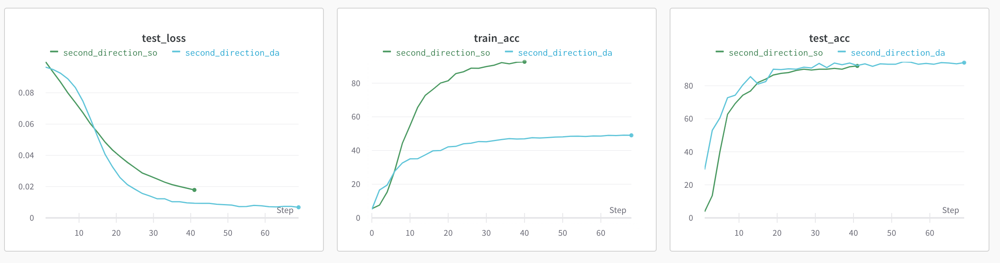

In [ ]:
Image(filename="/content/gdrive/MyDrive/DEEP_LEARNING_LAB/second_dir.png")

Below we can observe the three main losses of our domain adaptation phase. 
Starting from the top, we can observe the **transfer loss**, then the **classification loss** and finally the **total loss**, which is given by a weighted sum between the transfer loss and the classification loss. The weight is provided by the use of **lambda**. It's interesting to observe the development of transfer loss and classification loss. The former has a non-linear, but very wiggly trend and the latter falls smoothly.

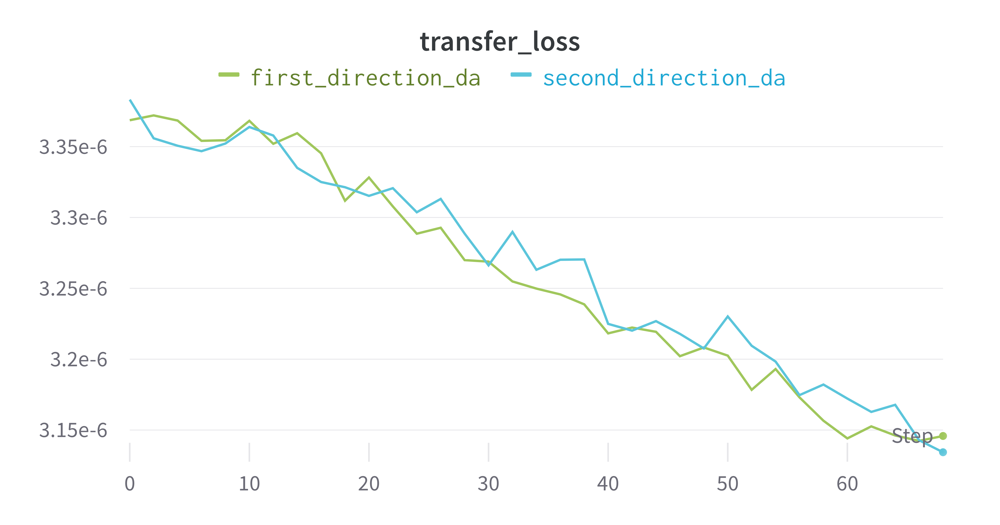

In [ ]:
Image(filename="/content/gdrive/MyDrive/DEEP_LEARNING_LAB/transfer_loss.png")

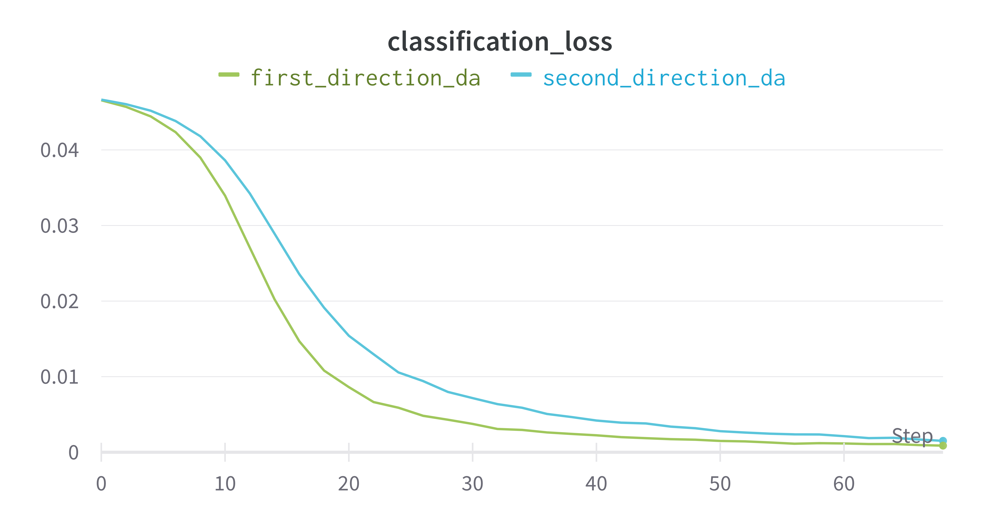

In [ ]:
Image(filename="/content/gdrive/MyDrive/DEEP_LEARNING_LAB/classification_loss.png")

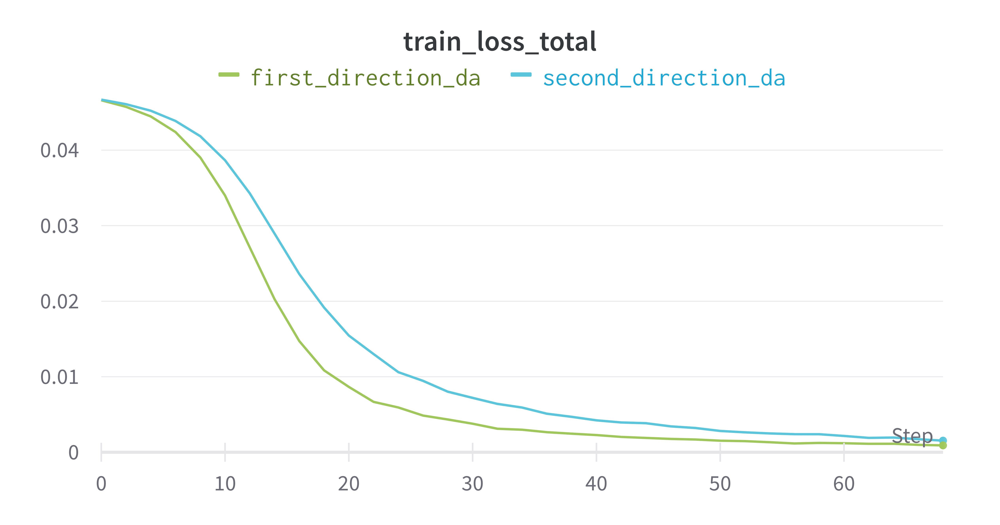

In [ ]:
Image(filename="/content/gdrive/MyDrive/DEEP_LEARNING_LAB/training_loss_total.png")